#Necessary Imports

In [ ]:
#import packages
import pandas as pd
import numpy as np
import statsmodels.api as sm
#to plot within notebook
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

sns.set()


#setting figure size
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 20,10

#for normalizing data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))



In [ ]:
#read the file
df = pd.read_csv('HistoricalData_APPLE.csv')

#print the head
df.head()

,Date,Close/Last,Volume,Open,High,Low
0,06/09/2021,$127.13,56877940,$127.21,$127.75,$126.52
1,06/08/2021,$126.74,74403770,$126.6,$128.46,$126.2101
2,06/07/2021,$125.9,71057550,$126.17,$126.32,$124.8321
3,06/04/2021,$125.89,75169340,$124.07,$126.16,$123.85
4,06/03/2021,$123.54,76229170,$124.68,$124.85,$123.13


In [ ]:
df.describe()

,Volume
count,2.516000e+03
mean,2.388826e+08
std,1.914594e+08
min,4.544820e+07
25%,1.092658e+08
50%,1.679334e+08
75%,3.022477e+08
max,1.498071e+09


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2516 entries, 0 to 2515
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Date        2516 non-null   object
 1   Close/Last  2516 non-null   object
 2   Volume      2516 non-null   int64 
 3   Open        2516 non-null   object
 4   High        2516 non-null   object
 5   Low         2516 non-null   object
dtypes: int64(1), object(5)
memory usage: 118.1+ KB


Converting from object to float

In [ ]:
df['Close/Last']=df['Close/Last'].replace('[\$]','',regex=True).astype(float)

In [ ]:
df.head()

,Date,Close/Last,Volume,Open,High,Low
0,06/09/2021,127.13,56877940,$127.21,$127.75,$126.52
1,06/08/2021,126.74,74403770,$126.6,$128.46,$126.2101
2,06/07/2021,125.90,71057550,$126.17,$126.32,$124.8321
3,06/04/2021,125.89,75169340,$124.07,$126.16,$123.85
4,06/03/2021,123.54,76229170,$124.68,$124.85,$123.13


In [ ]:
df[df.columns[3:]]=df[df.columns[3:]].replace('[\$]','',regex=True).astype(float)

In [ ]:
df.head()

,Date,Close/Last,Volume,Open,High,Low
0,06/09/2021,127.13,56877940,127.21,127.75,126.5200
1,06/08/2021,126.74,74403770,126.60,128.46,126.2101
2,06/07/2021,125.90,71057550,126.17,126.32,124.8321
3,06/04/2021,125.89,75169340,124.07,126.16,123.8500
4,06/03/2021,123.54,76229170,124.68,124.85,123.1300


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2516 entries, 0 to 2515
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        2516 non-null   object 
 1   Close/Last  2516 non-null   float64
 2   Volume      2516 non-null   int64  
 3   Open        2516 non-null   float64
 4   High        2516 non-null   float64
 5   Low         2516 non-null   float64
dtypes: float64(4), int64(1), object(1)
memory usage: 118.1+ KB


In [ ]:
df.isna().sum()

Date          0
Close/Last    0
Volume        0
Open          0
High          0
Low           0
dtype: int64

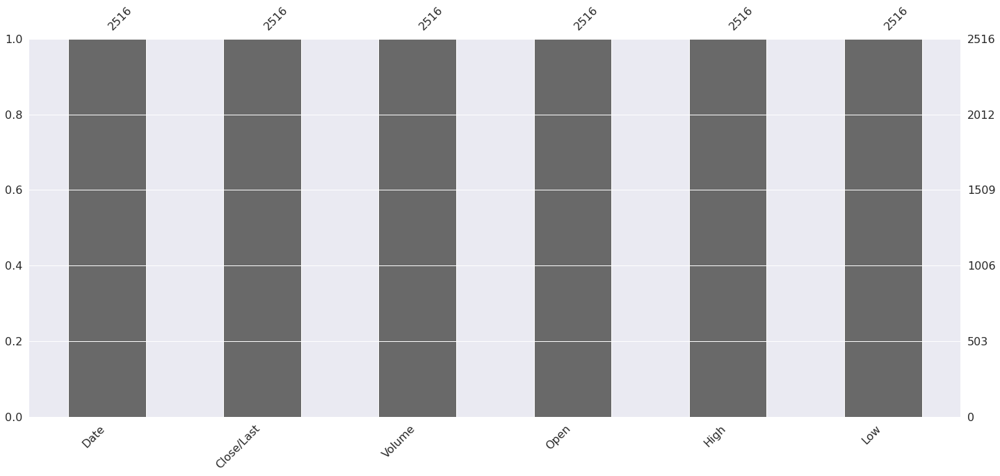

<Figure size 432x360 with 0 Axes>

In [ ]:
#Visualising the null data
import missingno as msno
msno.bar(df)
plt.figure(figsize=(6,5))
plt.show()

In [ ]:
df.var()

Close/Last    9.183834e+02
Volume        3.665672e+16
Open          9.192458e+02
High          9.424031e+02
Low           8.936198e+02
dtype: float64

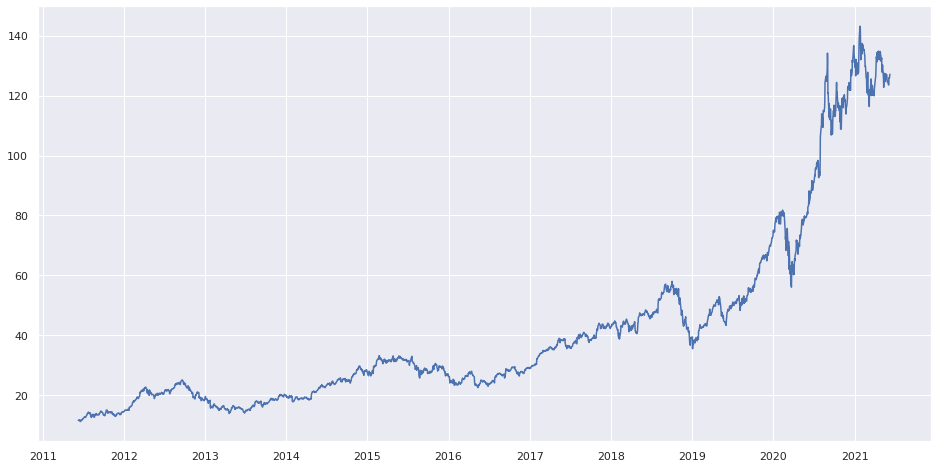

In [ ]:
#setting index as date
df['Date'] = pd.to_datetime(df.Date,format='%m/%d/%Y')
df.index = df['Date']

#plot
plt.figure(figsize=(16,8))
plt.plot(df['Close/Last'], label='Close Price history')

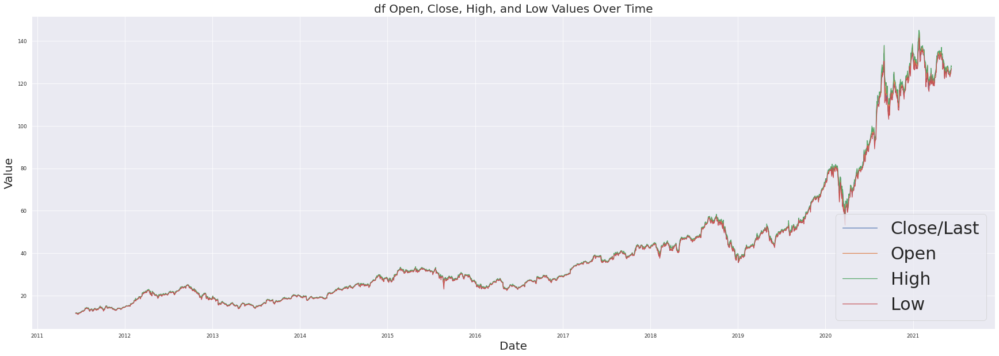

In [ ]:
# set the seaborn context so that labels and font are larger
sns.set_context("paper", rc={"font.size":40,"axes.titlesize":20,"axes.labelsize":20})
# Make figure size larger so can see details
plt.figure(figsize=(30, 10))
# grab columns I want to graph (volumn on different scale so not including, still not sure what adjusted close is)
temp = df[["Date", "Close/Last", "Open", "High", "Low"]]
# convert to long format for plotting
temp = temp.melt('Date', var_name = 'Metric', value_name = "Value")
# plot multiple lines using the column names as the coloring factor
sns.lineplot(x = "Date", y = 'Value', hue = 'Metric', data = temp)
plt.title("df Open, Close, High, and Low Values Over Time")
# have legend show in lower right since no data there and make font larger since larger plot
plt.legend(loc = "lower right", fontsize = 30)


<Figure size 1152x576 with 0 Axes>

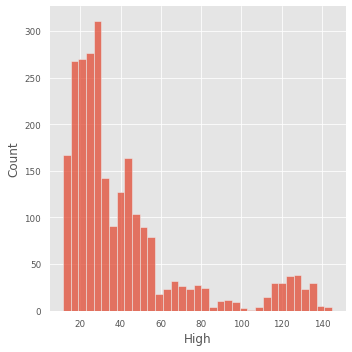

In [ ]:
plt.figure(figsize=(16,8))
plt.style.use('ggplot')
sns.displot(df['High'])
plt.show()


In [ ]:
df['Net_change'] = df['Close/Last'] - df['Open']
df.head()

,Date,Close/Last,Volume,Open,High,Low,Net_change
Date,,,,,,,
2021-06-09,2021-06-09,127.13,56877940,127.21,127.75,126.5200,-0.08
2021-06-08,2021-06-08,126.74,74403770,126.60,128.46,126.2101,0.14
2021-06-07,2021-06-07,125.90,71057550,126.17,126.32,124.8321,-0.27
2021-06-04,2021-06-04,125.89,75169340,124.07,126.16,123.8500,1.82
2021-06-03,2021-06-03,123.54,76229170,124.68,124.85,123.1300,-1.14


Text(0.5, 1.0, ' Net Change Boxplot')

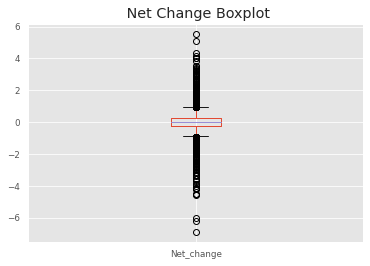

In [ ]:
df.boxplot(column='Net_change')
plt.title(" Net Change Boxplot")


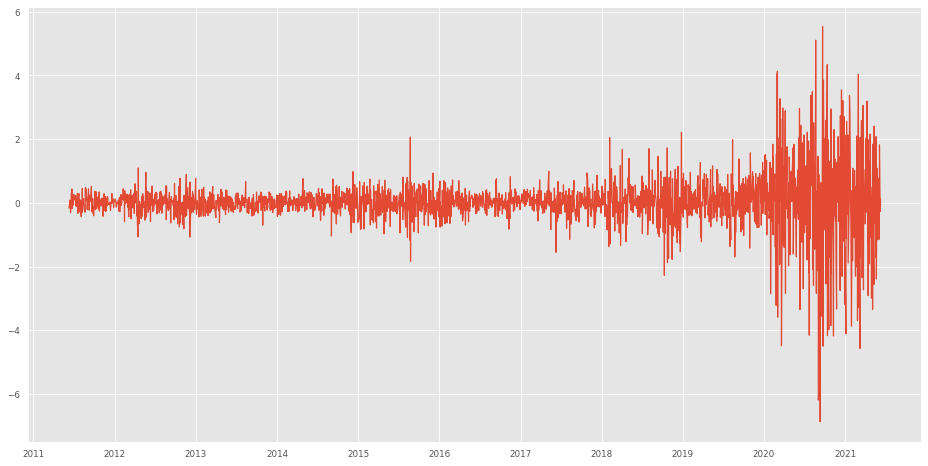

In [ ]:
#setting index as date
df['Date'] = pd.to_datetime(df.Date,format='%m/%d/%Y')
df.index = df['Date']

#plot
plt.figure(figsize=(16,8))
plt.plot(df['Net_change'], label='Net_change')

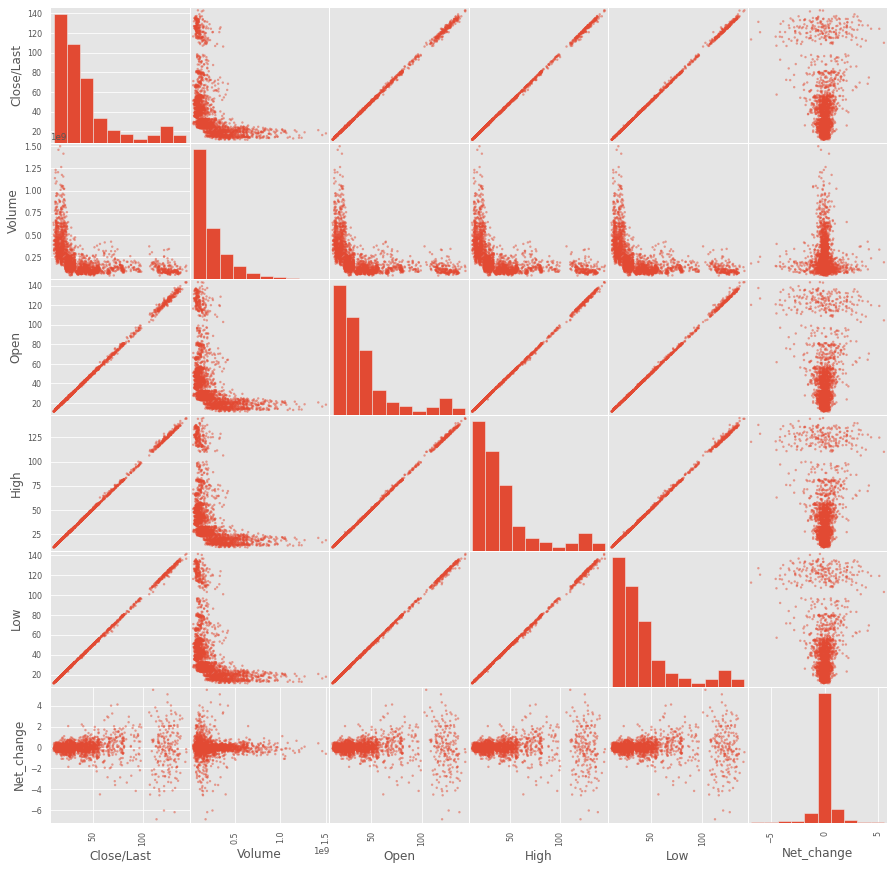

In [ ]:
pd.plotting.scatter_matrix(df, figsize = (15, 15))
plt.savefig("df_scatter_matrix_w_net_change.png")

# News Articles


In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.probability import FreqDist
import string
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
headlines_2021 = pd.read_csv("Headlines_2021.csv")
headline_2020= pd.read_csv("Headlines_2020.csv")
headline_2019= pd.read_csv("Headlines_2019.csv")
headline_2018= pd.read_csv("Headlines_2018.csv")
headline_2017= pd.read_csv("Headlines_2017.csv")
headline_2016= pd.read_csv("Headlines_2016.csv")
headline_2015= pd.read_csv("Headlines_2015.csv")
frames = [headlines_2021, headline_2020, headline_2019,headline_2018,headline_2017,headline_2016,headline_2015]

In [ ]:
headlines_df = pd.concat(frames)
display(headlines_df.head())

,Date,Headlines
0,2021-01-01,Tales of underage workers in Apple&quot;s supp...
1,2021-01-02,Why Apple &quot;iCar&quot; Won&quot;t Be Self-...
2,2021-01-03,The best after-Christmas deals you can get rig...
3,2021-01-04,How four of this year&quot;s Transformers help...
4,2021-01-05,The Apple Products That Could Be Released In 2...


In [ ]:
# compile regex since will be applying to multiple columns
bitstr_artifacts = re.compile(r"""^b'|^b"|"$|'$""")
# replace all instances of bitstring artifacts from headline columns in combined dataframe
for col in list(headlines_df.columns)[1:]:
    headlines_df[col] = headlines_df[col].str.replace(bitstr_artifacts, '')

In [ ]:
headlines_df['Headlines'] = headlines_df['Headlines'].str.replace(bitstr_artifacts, '')
headlines_df['tokenized'] = headlines_df['Headlines'].apply(word_tokenize)
headlines_df.head()

,Date,Headlines,tokenized
0,2021-01-01,Tales of underage workers in Apple&quot;s supp...,"[Tales, of, underage, workers, in, Apple, &, q..."
1,2021-01-02,Why Apple &quot;iCar&quot; Won&quot;t Be Self-...,"[Why, Apple, &, quot, ;, iCar, &, quot, ;, Won..."
2,2021-01-03,The best after-Christmas deals you can get rig...,"[The, best, after-Christmas, deals, you, can, ..."
3,2021-01-04,How four of this year&quot;s Transformers help...,"[How, four, of, this, year, &, quot, ;, s, Tra..."
4,2021-01-05,The Apple Products That Could Be Released In 2...,"[The, Apple, Products, That, Could, Be, Releas..."


In [ ]:
headlines_df.tail()

,Date,Headlines,tokenized
360,2015-12-27,Company Shares of Apple Inc. (NASDAQ:AAPL) Ral...,"[Company, Shares, of, Apple, Inc., (, NASDAQ, ..."
361,2015-12-28,Apple&quot;s Chart Indicates A Tough Start To ...,"[Apple, &, quot, ;, s, Chart, Indicates, A, To..."
362,2015-12-29,Market Update (NASDAQ:AAPL): Apple And IBM To ...,"[Market, Update, (, NASDAQ, :, AAPL, ), :, App..."
363,2015-12-30,Why Apple Is In For A &quot;Tough&quot; 2016 R...,"[Why, Apple, Is, In, For, A, &, quot, ;, Tough..."
364,2015-12-31,"Noteworthy Thursday Option Activity: AAPL, OVT...","[Noteworthy, Thursday, Option, Activity, :, AA..."


1

In [ ]:
# saw instance of & in S&P encoded as &amp; in last row of combined_df.tail(), replace with and to maintain semantic
headlines_df['Headlines'] = headlines_df['Headlines'].str.replace("&amp;", "and")
# replace hyphens with blank space. Don't want to combine hyphenations into single word as more meaninful as separate words
headlines_df['Headlines'] = headlines_df['Headlines'].str.replace("-", " ")
# replace all punctuation with blank space
headlines_df['Headlines'] = headlines_df['Headlines'].str.replace(rf'[{string.punctuation}]', "")
headlines_df['tokenized'] = headlines_df['Headlines'].apply(word_tokenize)
headlines_df.head()

,Date,Headlines,tokenized
0,2021-01-01,Tales of underage workers in Applequots supply...,"[Tales, of, underage, workers, in, Applequots,..."
1,2021-01-02,Why Apple quotiCarquot Wonquott Be Self Drivin...,"[Why, Apple, quotiCarquot, Wonquott, Be, Self,..."
2,2021-01-03,The best after Christmas deals you can get rig...,"[The, best, after, Christmas, deals, you, can,..."
3,2021-01-04,How four of this yearquots Transformers helped...,"[How, four, of, this, yearquots, Transformers,..."
4,2021-01-05,The Apple Products That Could Be Released In 2...,"[The, Apple, Products, That, Could, Be, Releas..."


In [ ]:
headlines_df.tail()

,Date,Headlines,tokenized
360,2015-12-27,Company Shares of Apple Inc NASDAQAAPL Rally 1...,"[Company, Shares, of, Apple, Inc, NASDAQAAPL, ..."
361,2015-12-28,Applequots Chart Indicates A Tough Start To 20...,"[Applequots, Chart, Indicates, A, Tough, Start..."
362,2015-12-29,Market Update NASDAQAAPL Apple And IBM To Star...,"[Market, Update, NASDAQAAPL, Apple, And, IBM, ..."
363,2015-12-30,Why Apple Is In For A quotToughquot 2016 Repor...,"[Why, Apple, Is, In, For, A, quotToughquot, 20..."
364,2015-12-31,Noteworthy Thursday Option Activity AAPL OVTI ...,"[Noteworthy, Thursday, Option, Activity, AAPL,..."


2

In [ ]:
headlines_df[headlines_df['Date'] == '2021-06-01']

,Date,Headlines,tokenized
151,2021-06-01,Judge dismisses charges against Apple security...,"[Judge, dismisses, charges, against, Apple, se..."


In [ ]:
all_headlines = " ".join(headlines_df['Headlines'])
all_headlines
fdist = FreqDist(all_headlines.split())
fdist

FreqDist({'Tales': 21,
          'of': 12836,
          'underage': 1,
          'workers': 119,
          'in': 19227,
          'Applequots': 10418,
          'supply': 176,
          'chain': 77,
          'secret': 74,
          'roadmap': 5,
          'Tech': 3788,
          'we': 250,
          'lost': 123,
          '2020': 1113,
          'Farmville': 1,
          'Flash': 49,
          'and': 14081,
          'Segway': 3,
          'top': 532,
          'list': 140,
          'Tesla': 1669,
          'And': 3046,
          'Apple': 74645,
          'Had': 63,
          'The': 9430,
          'Biggest': 318,
          'Impact': 204,
          'On': 2896,
          'Market': 3394,
          'Stock': 8936,
          'Buy': 4176,
          'Sell': 643,
          'or': 1215,
          'Hold': 426,
          'After': 1146,
          'Soaring': 62,
          '81': 22,
          '22': 94,
          'biggest': 417,
          'tech': 1789,
          'scandals': 5,
          'from': 3087

3

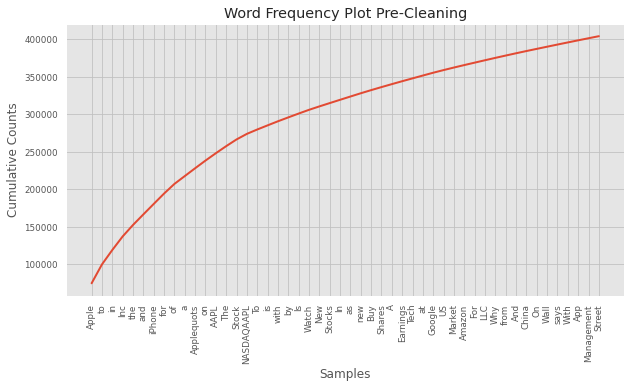

In [ ]:
plt.figure(figsize=(10, 5))
plt.title("Word Frequency Plot Pre-Cleaning")
fdist.plot(50, cumulative=True)

4

In [ ]:
en_stops = set(stopwords.words('english'))
all_headlines_no_stopwords = ""
for word in all_headlines.split():
    if word not in en_stops:
        all_headlines_no_stopwords += word + " "
all_headlines_no_stopwords

'Tales underage workers Applequots supply chain Applequots secret roadmap Tech lost 2020 Farmville Flash Segway top list Tesla And Apple Had The Biggest Impact On The Market Apple Stock Buy Sell Hold After Soaring 81 2020 The 22 biggest tech scandals 2020 unprecedented Twitter hack makers quotFortnitequot declaring war Apple The Apple Watch SE best purchase 2020 herequots Applequots exciting product ever Is Applequots share price headed new year Tesla says deliveries China made Model Y SUV begin month Apple Best Stock Of 2020 Surges Into New Year 5 quotmonsterquot investment themes Iquotm betting 2021 Tesla leads list 2020quots biggest winners SP 500 Nasdaq 100 Why Apple quotiCarquot Wonquott Be Self Driving Gene Munster Apple 2021quots top performing FAANG Apple Won 5 Design Patents presented photo line art forms covering iPad Pro Magic Keyboard Combination Apple let Amphetamine app stay App Store wrongly telling developer violated App Store rules Bold Prediction General Motors Is Nex

issues with the approach of not lowercasing words before removing stop words as I still see instances of the word A and If, which both should've been removed. 

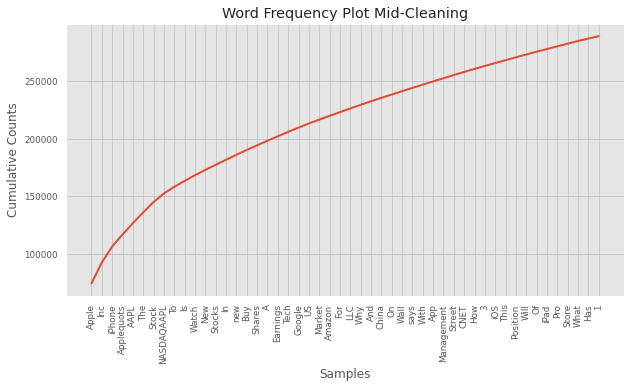

In [ ]:
fdist2 = FreqDist(all_headlines_no_stopwords.split())
plt.figure(figsize=(10, 5))
plt.title("Word Frequency Plot Mid-Cleaning")
fdist2.plot(50, cumulative=True)

As expeced, a lot less stop words are showing up, but the words The and A, which are clearly stop words not removed due to these being capitalized, still account for 2 of the top 4 most common words here indicating why it's so important to remove stop words as this is even with the lower case versions of these removed! Now lets lowercase everything and then remove stopwords, which is what I should've done in the first place, and see what we're left with:

In [ ]:
all_headlines_lower = all_headlines.lower()
all_headlines_lower_no_stopwords = ""
for word in all_headlines_lower.split():
    if word not in en_stops:
        all_headlines_lower_no_stopwords += word + " "
all_headlines_lower_no_stopwords

'tales underage workers applequots supply chain applequots secret roadmap tech lost 2020 farmville flash segway top list tesla apple biggest impact market apple stock buy sell hold soaring 81 2020 22 biggest tech scandals 2020 unprecedented twitter hack makers quotfortnitequot declaring war apple apple watch se best purchase 2020 herequots applequots exciting product ever applequots share price headed new year tesla says deliveries china made model suv begin month apple best stock 2020 surges new year 5 quotmonsterquot investment themes iquotm betting 2021 tesla leads list 2020quots biggest winners sp 500 nasdaq 100 apple quoticarquot wonquott self driving gene munster apple 2021quots top performing faang apple 5 design patents presented photo line art forms covering ipad pro magic keyboard combination apple let amphetamine app stay app store wrongly telling developer violated app store rules bold prediction general motors next apple stock investors benzingaquots final bulls bears year

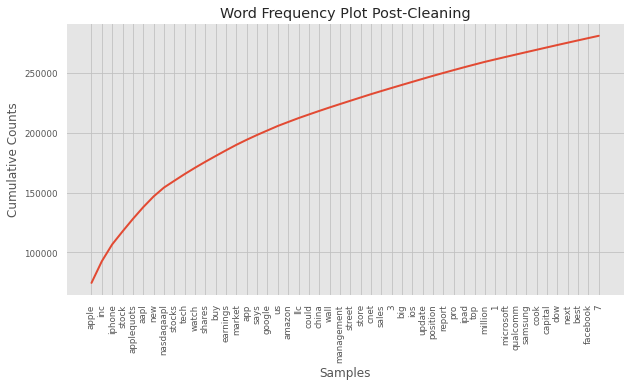

In [ ]:
fdist3 = FreqDist(all_headlines_lower_no_stopwords.split())
plt.figure(figsize=(10, 5))
plt.title("Word Frequency Plot Post-Cleaning")
fdist3.plot(50, cumulative=True)

In [ ]:
def rm_stopwords(item):
    cleaned = ""
    temp = item.split()
    for word in temp:
        if word not in en_stops:
            cleaned += word + " "
    return cleaned


def rm_digits(item):
    cleaned = ""
    temp = item.split()
    for word in temp:
        if not word.isdigit():
            cleaned += word + " "
    return cleaned


def lowercase_rm_stopwords_and_digits(col):
    temp = col.str.lower()
    temp = temp.apply(rm_stopwords)
    temp = temp.apply(rm_digits)
    return temp

headlines_df['News_cleaned'] = lowercase_rm_stopwords_and_digits(headlines_df["Headlines"])
headlines_df.head()

,Date,Headlines,tokenized,News_cleaned
0,2021-01-01,Tales of underage workers in Applequots supply...,"[Tales, of, underage, workers, in, Applequots,...",tales underage workers applequots supply chain...
1,2021-01-02,Why Apple quotiCarquot Wonquott Be Self Drivin...,"[Why, Apple, quotiCarquot, Wonquott, Be, Self,...",apple quoticarquot wonquott self driving gene ...
2,2021-01-03,The best after Christmas deals you can get rig...,"[The, best, after, Christmas, deals, you, can,...",best christmas deals get right save lenovo yog...
3,2021-01-04,How four of this yearquots Transformers helped...,"[How, four, of, this, yearquots, Transformers,...",four yearquots transformers helped worldquots ...
4,2021-01-05,The Apple Products That Could Be Released In 2...,"[The, Apple, Products, That, Could, Be, Releas...",apple products could released apple aapl outpa...
